In [1]:
"""
GoogleNet:
uses a 1×1 convolution and global average pooling that enables it to create deeper architecture.

1x1 convolution is used to decrease the number of parameters (weights and biases) of the architecture.
By reducing the parameters we also increase the depth of the architecture

For e.g. 5×5 convolution having 48 filters without using 1×1 convolution as intermediate:
Total Number of operations : (14 x 14 x 48) x (5 x 5 x 480) = 112.9 M

With 1×1 convolution :
(14 x 14 x 16) x (1 x 1 x 480) + (14 x 14 x 48) x (5 x 5 x 16) = 1.5M + 3.8M = 5.3M which is much smaller than 112.9M.




global average pooling:
is used at the end of the network.
This layer takes a feature map of 7×7 and averages it to 1×1.
This also decreases the number of trainable parameters to 0 and improves the top-1 accuracy by 0.6%


Inception Module:
In this architecture, there is a fixed convolution size for each layer.


ARCHITECTURE:

The overall architecture is 22 layers deep.
The architecture was designed to keep computational efficiency in mind e.g. phones
The idea behind that the architecture can be run on individual devices even with low computational resources.

This architecture takes image of size 224 x 224 with RGB color channels.
All the convolutions inside this architecture uses Rectified Linear Units (ReLU) as their activation functions.

The architecture also contains two auxiliary classifier layer connected to the output of Inception (4a) and Inception (4d) layers.
The architectural details of auxiliary classifiers as follows:
    1. An average pooling layer of filter size 5×5 and stride 3.
    2. A 1×1 convolution with 128 filters for dimension reduction and ReLU activation.
    3. A fully connected layer with 1025 outputs and ReLU activation
    4. Dropout Regularization with dropout ratio = 0.7
A softmax classifier with 1000 classes output similar to the main softmax classifier.

"""


'\nGoogleNet:\nuses a 1×1 convolution and global average pooling that enables it to create deeper architecture.\n\n1x1 convolution is used to decrease the number of parameters (weights and biases) of the architecture.\nBy reducing the parameters we also increase the depth of the architecture\n\nFor e.g. 5×5 convolution having 48 filters without using 1×1 convolution as intermediate:\nTotal Number of operations : (14 x 14 x 48) x (5 x 5 x 480) = 112.9 M\n\nWith 1×1 convolution :\n(14 x 14 x 16) x (1 x 1 x 480) + (14 x 14 x 48) x (5 x 5 x 16) = 1.5M + 3.8M = 5.3M which is much smaller than 112.9M.\n\n\n\n\nglobal average pooling:\nis used at the end of the network.\nThis layer takes a feature map of 7×7 and averages it to 1×1.\nThis also decreases the number of trainable parameters to 0 and improves the top-1 accuracy by 0.6%\n\n\nInception Module:\nIn this architecture, there is a fixed convolution size for each layer.\n\n\nARCHITECTURE:\n\nThe overall architecture is 22 layers deep.\nT

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#import the required libraries
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [4]:
#defining  important the attributes
IMAGE_SIZE=224 # L x W
CHANNELS=3
BATCH_SIZE=32
EPOCHS=epochs=5
dataset = '/content/drive/MyDrive/ds/augmented_dataset/'

# Define the file path to save the best model
model_checkpoint = '/content/drive/MyDrive/GoogleNet/models/best_model.h5'

# Define a callback to save the best model based on validation accuracy
from tensorflow.keras import callbacks
checkpoint_callback = callbacks.ModelCheckpoint(model_checkpoint, monitor='val_main_output_accuracy',
                                                save_best_only=True, mode='max', verbose=1)

CLASSES

In [5]:
# verify classes are balanced
def count_images(directory):
    image_count = 0
    for filename in os.listdir(directory):
        img_path = os.path.join(directory, filename)
        if os.path.isfile(img_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_count += 1
    return image_count

# Loop through each class (subdirectory) in the dataset directory
for subdir in os.listdir(dataset):
    class_dir = os.path.join(dataset, subdir)

    # Check if it's a directory
    if os.path.isdir(class_dir):
        # Count the number of images in this class directory
        image_count = count_images(class_dir)
        print(f"Class {subdir}: {image_count} images")
    else:
        print(f"{subdir} is not a directory.")

Class storagetanks: 210 images
Class river: 210 images
Class mediumresidential: 210 images
Class buildings: 210 images
Class mobilehomepark: 210 images
Class tenniscourt: 210 images
Class baseballdiamond: 210 images
Class intersection: 210 images
Class parkinglot: 210 images
Class agricultural: 210 images
Class freeway: 210 images
Class runway: 210 images
Class harbor: 210 images
Class sparseresidential: 210 images
Class denseresidential: 210 images
Class forest: 210 images
Class beach: 210 images
Class overpass: 210 images
Class airplane: 210 images
Class golfcourse: 210 images
Class chaparral: 210 images


In [6]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/ds/augmented_dataset/',
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 4410 files belonging to 21 classes.


In [7]:
landuse_class_names = dataset.class_names
landuse_class_names

['agricultural',
 'airplane',
 'baseballdiamond',
 'beach',
 'buildings',
 'chaparral',
 'denseresidential',
 'forest',
 'freeway',
 'golfcourse',
 'harbor',
 'intersection',
 'mediumresidential',
 'mobilehomepark',
 'overpass',
 'parkinglot',
 'river',
 'runway',
 'sparseresidential',
 'storagetanks',
 'tenniscourt']

In [8]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape)

(224, 224, 3)


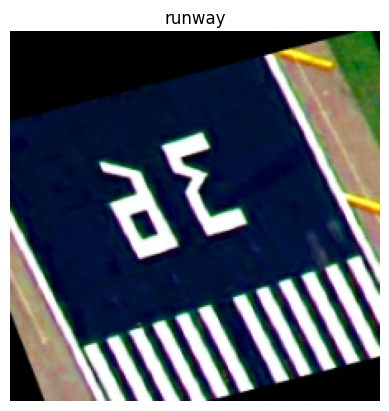

In [9]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(landuse_class_names[label_batch[0]])
    plt.axis("off")

In [10]:
# Extract class names from the dataset
class_names = dataset.class_names

# Prepare to display one image per class
plt.figure(figsize=(15, 15))

# Dictionary to store the first image path per class
class_first_image_paths = {}

# Iterate over the dataset to find and display the first image from each class
for images, labels in dataset:
    for image, label in zip(images, labels):
        class_name = class_names[label.numpy()]  # Get the class name from the label
        if class_name not in class_first_image_paths:
            # Store the path of the first image encountered for this class
            class_first_image_paths[class_name] = image
            # Display the first image found for this class
            plt.subplot(5, 5, len(class_first_image_paths))  # Adjust subplot position dynamically
            plt.imshow(image.numpy().astype("uint8"))
            plt.title(class_name)
            plt.axis("off")

        # Break loop if we have found one image per class
        if len(class_first_image_paths) == len(class_names):
            break

    # Break outer loop if we have found one image per class
    if len(class_first_image_paths) == len(class_names):
        break

plt.tight_layout()  # Adjust subplot layout to prevent overlap
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [11]:
# function to split DS
def get_dataset_partitions_tf(ds, train_split=0.7, val_split=0.2 ,test_split=0.1, shuffle=True, shuffle_size=10000):

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split*ds_size)
    val_size = int(val_split*ds_size)

    train_data_s = ds.take(train_size)
    val_data_s = ds.skip(train_size).take(val_size)
    test_data_s = ds.skip(train_size).skip(val_size)

    return train_data_s, val_data_s, test_data_s

train_data_s, val_data_s, test_data_s = get_dataset_partitions_tf(dataset)

In [12]:
len(train_data_s)

96

In [13]:
len(val_data_s)

27

In [14]:
len(test_data_s)

15

In [15]:
# The data generators
train_data_s = train_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data_s = val_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data_s = test_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

**GOOGLENET ARCHITECTURE**

In [16]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks

def InceptionModule(filters_1x1, filters_3x3_reduce, filters_3x3, filters_5x5_reduce, filters_5x5, filters_pool):
    def module(inputs):
        conv_1x1 = layers.Conv2D(filters_1x1, (1, 1), padding='same', activation='relu')(inputs)
        conv_3x3_reduce = layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')(inputs)
        conv_3x3 = layers.Conv2D(filters_3x3, (3, 3), padding='same', activation='relu')(conv_3x3_reduce)
        conv_5x5_reduce = layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')(inputs)
        conv_5x5 = layers.Conv2D(filters_5x5, (5, 5), padding='same', activation='relu')(conv_5x5_reduce)
        pool_proj = layers.Conv2D(filters_pool, (1, 1), padding='same', activation='relu')(inputs)
        max_pool = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(inputs)
        pool_proj = layers.Conv2D(filters_pool, (1, 1), padding='same', activation='relu')(max_pool)
        concat = layers.concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=-1)
        return concat
    return module

def auxiliary_classifier(inputs, num_classes=21, name=None):
    x = layers.AveragePooling2D((5, 5), strides=3)(inputs)
    x = layers.Conv2D(128, (1, 1), padding='same', activation='relu')(x)
    x = layers.Flatten()(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax', name=name)(x)
    return outputs

def googlenet(input_shape=(224, 224, 3), num_classes=21):
    inputs = layers.Input(shape=input_shape)

    x = layers.Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu')(inputs)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
    x = layers.Conv2D(64, (1, 1), padding='same', activation='relu')(x)
    x = layers.Conv2D(192, (3, 3), padding='same', activation='relu')(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    x = InceptionModule(64, 96, 128, 16, 32, 32)(x)
    x = InceptionModule(128, 128, 192, 32, 96, 64)(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    x = InceptionModule(192, 96, 208, 16, 48, 64)(x)
    x = InceptionModule(160, 112, 224, 24, 64, 64)(x)
    x = InceptionModule(128, 128, 256, 24, 64, 64)(x)
    x = InceptionModule(112, 144, 288, 32, 64, 64)(x)
    x = InceptionModule(256, 160, 320, 32, 128, 128)(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    x = InceptionModule(256, 160, 320, 32, 128, 128)(x)
    x = InceptionModule(384, 192, 384, 48, 128, 128)(x)

    # Auxiliary classifier 1
    aux1 = auxiliary_classifier(x, num_classes=num_classes, name='auxiliary_output')

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation='softmax', name='main_output')(x)

    model = models.Model(inputs, [outputs, aux1], name='GoogLeNet')
    return model

# Instantiate the model with 21 classes
model = googlenet(num_classes=21)

# Compile the model with 'adam' optimizer, 'sparse_categorical_crossentropy' loss, and metrics
model.compile(optimizer='adam',
              loss={'main_output': 'sparse_categorical_crossentropy', 'auxiliary_output': 'sparse_categorical_crossentropy'},
              loss_weights={'main_output': 1.0, 'auxiliary_output': 0.3},
              metrics={'main_output': 'accuracy', 'auxiliary_output': 'accuracy'})

# Display the model architecture
model.summary()


Model: "GoogLeNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 64)         9472      ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 56, 56, 64)           0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 56, 56, 64)           4160      ['max_pooling2d[0][0]'

In [ ]:
# import tensorflow as tf
# from tensorflow.keras import layers, models

# class InceptionModule(layers.Layer):
#     def __init__(self, filters_1x1, filters_3x3_reduce, filters_3x3, filters_5x5_reduce, filters_5x5, filters_pool):
#         super(InceptionModule, self).__init__()
#         self.conv_1x1 = layers.Conv2D(filters_1x1, (1, 1), padding='same', activation='relu')
#         self.conv_3x3_reduce = layers.Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu')
#         self.conv_3x3 = layers.Conv2D(filters_3x3, (3, 3), padding='same', activation='relu')
#         self.conv_5x5_reduce = layers.Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu')
#         self.conv_5x5 = layers.Conv2D(filters_5x5, (5, 5), padding='same', activation='relu')
#         self.pool_proj = layers.Conv2D(filters_pool, (1, 1), padding='same', activation='relu')
#         self.max_pool = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')

#     def call(self, inputs):
#         conv_1x1 = self.conv_1x1(inputs)
#         conv_3x3 = self.conv_3x3(self.conv_3x3_reduce(inputs))
#         conv_5x5 = self.conv_5x5(self.conv_5x5_reduce(inputs))
#         pool_proj = self.pool_proj(self.max_pool(inputs))
#         return layers.concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=-1)

# def auxiliary_classifier(inputs, num_classes=21):
#     x = layers.AveragePooling2D((5, 5), strides=3)(inputs)
#     x = layers.Conv2D(128, (1, 1), padding='same', activation='relu')(x)
#     x = layers.Flatten()(x)
#     x = layers.Dense(1024, activation='relu')(x)
#     x = layers.Dropout(0.5)(x)
#     outputs = layers.Dense(num_classes, activation='softmax')(x)
#     return outputs

# def googlenet(input_shape=(224, 224, 3), num_classes=21):
#     inputs = layers.Input(shape=input_shape)

#     x = layers.Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu')(inputs)
#     x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
#     x = layers.Conv2D(64, (1, 1), padding='same', activation='relu')(x)
#     x = layers.Conv2D(192, (3, 3), padding='same', activation='relu')(x)
#     x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

#     x = InceptionModule(64, 96, 128, 16, 32, 32)(x)
#     x = InceptionModule(128, 128, 192, 32, 96, 64)(x)
#     x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

#     x = InceptionModule(192, 96, 208, 16, 48, 64)(x)
#     x = InceptionModule(160, 112, 224, 24, 64, 64)(x)
#     x = InceptionModule(128, 128, 256, 24, 64, 64)(x)
#     x = InceptionModule(112, 144, 288, 32, 64, 64)(x)
#     x = InceptionModule(256, 160, 320, 32, 128, 128)(x)
#     x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

#     x = InceptionModule(256, 160, 320, 32, 128, 128)(x)
#     x = InceptionModule(384, 192, 384, 48, 128, 128)(x)

#     # Auxiliary classifier 1
#     aux1 = auxiliary_classifier(x)

#     x = layers.GlobalAveragePooling2D()(x)
#     x = layers.Dropout(0.4)(x)
#     outputs = layers.Dense(num_classes, activation='softmax')(x)

#     model = models.Model(inputs, [outputs, aux1], name='GoogLeNet')
#     return model

# # Instantiate the model with 21 classes
# model = googlenet(num_classes=21)

# from tensorflow.keras import backend as K
# def recall(y_true, y_pred):
#     """Custom recall metric function."""
#     true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))  # Count true positives
#     possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))  # Count all actual positives
#     recall = true_positives / (possible_positives + true_positives)  # Avoid division by zero
#     return recall


# # Compile the model
# model.compile(optimizer='adam',
#               loss='sparse_categorical_crossentropy',
#               metrics=[recall])

# # Display the model architecture
# model.summary()


In [ ]:
# Train the model
history = model.fit(
    train_data_s,
    validation_data=val_data_s,
    epochs=EPOCHS,
    callbacks=[checkpoint_callback]
)


Epoch 1/5


In [ ]:
# Save the training history to a file using pickle
import pickle
history_file_path = '/content/drive/MyDrive/GoogleNet/models/training_history.pkl'
with open(history_file_path, 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
scores = model.evaluate(test_data_s)
scores

In [ ]:
history.history.keys()

In [ ]:
history.params

In [ ]:
history.history['val_main_output_accuracy']

In [ ]:
main_loss =history.history['main_output_loss']
aux_loss =history.history['auxiliary_output_loss']

main_accuracy =history.history['main_output_accuracy']
aux_accuracy =history.history['auxiliary_output_accuracy']

val_main_accuracy =history.history['val_main_output_accuracy']
val_aux_accuracy =history.history['val_auxiliary_output_accuracy']

val_main_loss =history.history['val_main_output_loss']
val_aux_loss =history.history['val_auxiliary_output_loss']

**TRAINING AND VALIDATION**

In [ ]:
EPOCHS=EPOCHS
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), main_accuracy, label='Training accuracy')
plt.plot(range(EPOCHS), val_main_accuracy, label='Validation accuracy')
plt.legend(loc='lower right')
plt.title('Main Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS), main_loss, label='Training loss')
plt.plot(range(EPOCHS), val_main_loss, label='Validation loss')
plt.legend(loc='upper right')
plt.title('Main Training and Validation loss')

**AUXILLARY TRAINING AND VALIDATION LOSS**

In [ ]:
EPOCHS=EPOCHS
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), aux_accuracy, label='Training accuracy')
plt.plot(range(EPOCHS), val_aux_accuracy, label='Validation accuracy')
plt.legend(loc='lower right')
plt.title('Auxillary Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS), aux_loss, label=' Training loss')
plt.plot(range(EPOCHS), val_aux_loss, label='Validation loss')
plt.legend(loc='upper right')
plt.title('Auxillary Training and Validation loss')

In [ ]:
model

First image to predict


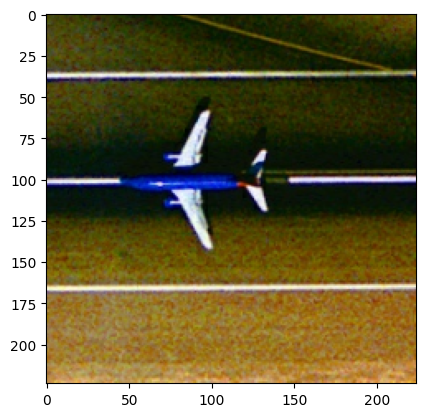

Actual label:  airplane
1/1 [==============================] - 0s 32ms/step
predicted label: airplane


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming landuse_class_names is defined somewhere in your code

for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("First image to predict")
    plt.imshow(first_image)
    plt.show()

    print("Actual label: ", landuse_class_names[first_label])
    batch_prediction = model.predict(images_batch)
    # print("Predicted label:", landuse_class_names[np.argmax(batch_prediction[0])])
    print("predicted label:",landuse_class_names[np.argmax(batch_prediction[0])])


First image to predict


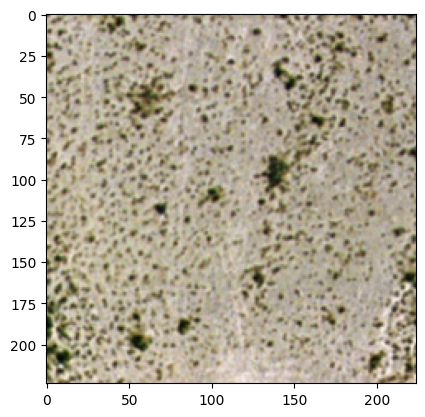

Actual label:  chaparral
1/1 [==============================] - 1s 535ms/step
Predicted label for the first sample: forest


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

images_batch, labels_batch = next(iter(test_data_s))

first_image = images_batch[0].numpy().astype('uint8')
first_label = labels_batch[0].numpy()

print("First image to predict")
plt.imshow(first_image)
plt.show()

print("Actual label: ", landuse_class_names[first_label])

# Predict using the model for the first image only
batch_prediction = model.predict(np.expand_dims(images_batch[0], axis=0))

# Ensure batch_prediction is as expected
if isinstance(batch_prediction, list) and len(batch_prediction) > 0:
    predictions_main = batch_prediction[0]  # Assuming this is the main output predictions

    # Get the predicted class index for the first sample
    predicted_class_index = np.argmax(predictions_main)

    if predicted_class_index < len(landuse_class_names):
        predicted_label = landuse_class_names[predicted_class_index]
        print(f"Predicted label for the first sample: {predicted_label}")
    else:
        print(f"Predicted class index out of range for the first sample: {predicted_class_index}")
else:
    print("Unexpected format for batch_prediction")


first image to predict
actual label:  golfcourse
1/1 [==============================] - 0s 22ms/step
predicted label: golfcourse
9


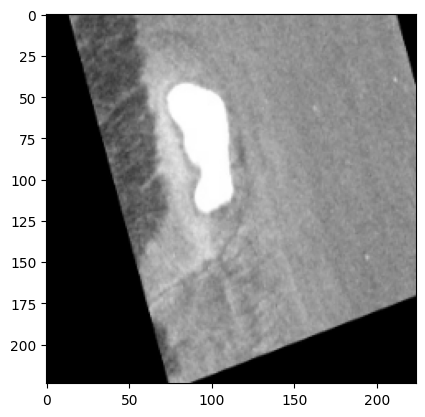

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label= labels_batch [0].numpy()

    print("first image to predict")
    plt.imshow(first_image)

    print("actual label: ",landuse_class_names[first_label])
    batch_prediction=model.predict(images_batch)
    batch_prediction = model.predict(np.expand_dims(images_batch[0], axis=0))
    print("predicted label:",landuse_class_names[np.argmax(batch_prediction[0])])
    print(np.argmax(batch_prediction[0]))
    # np.argmax(predictions_main)

1/1 [==============================] - 0s 22ms/step


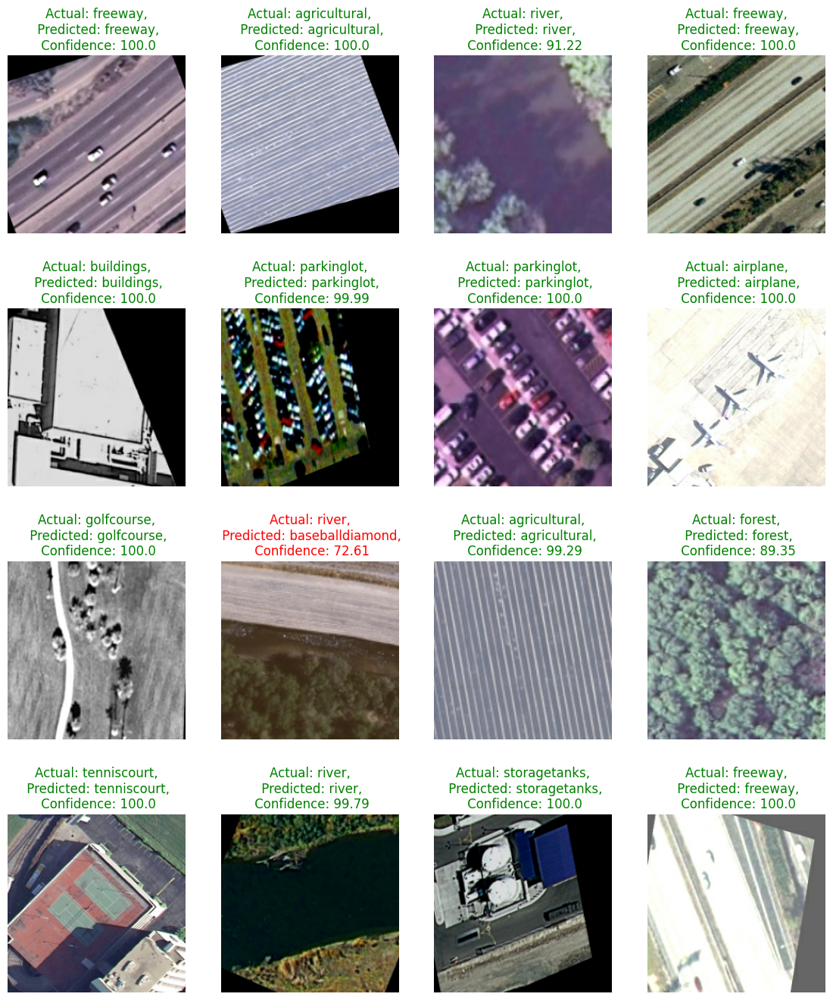

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function with access to landuse_class_names
def predict(model, img):
    img_array = np.expand_dims(img, axis=0)
    predictions = model.predict(img_array)
    predicted_class = landuse_class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

# Assuming landuse_class_names is defined somewhere in your code

plt.figure(figsize=(16, 16))
for images, labels in test_data_s.take(1):

    for i in range(16) :

        ax = plt.subplot(4, 4, i+1)
        plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class= landuse_class_names[labels[i]]

        # plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}")
        if actual_class == predicted_class:
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}", color='green')
        else:
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}", color='red')

        plt.axis("off")


In [ ]:
!pip install seaborn

1/1 [==============================] - 0s 29ms/step


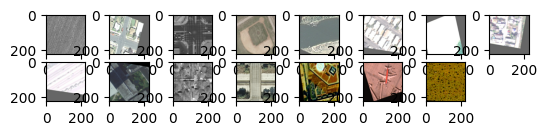

In [ ]:
y_pred = []
y_true = []
for images, labels in test_data_s:

    for i in range(len(test_data_s)) :

        ax = plt.subplot(8, 8, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class=landuse_class_names[labels[i]]
        y_pred.append(predicted_class)
        y_true.append(actual_class)

In [ ]:
y_true

['denseresidential',
 'buildings',
 'mediumresidential',
 'freeway',
 'beach',
 'river',
 'river',
 'mediumresidential',
 'buildings',
 'river',
 'freeway',
 'denseresidential',
 'golfcourse',
 'overpass',
 'mobilehomepark',
 'river',
 'river',
 'river',
 'storagetanks',
 'tenniscourt',
 'tenniscourt',
 'forest',
 'river',
 'freeway',
 'airplane',
 'river',
 'mediumresidential',
 'airplane',
 'chaparral',
 'storagetanks',
 'airplane',
 'mediumresidential',
 'river',
 'airplane',
 'overpass',
 'agricultural',
 'mobilehomepark',
 'airplane',
 'harbor',
 'sparseresidential',
 'beach',
 'denseresidential',
 'harbor',
 'airplane',
 'mediumresidential',
 'chaparral',
 'river',
 'parkinglot',
 'beach',
 'baseballdiamond',
 'airplane',
 'runway',
 'freeway',
 'denseresidential',
 'baseballdiamond',
 'intersection',
 'tenniscourt',
 'sparseresidential',
 'chaparral',
 'storagetanks',
 'storagetanks',
 'parkinglot',
 'golfcourse',
 'storagetanks',
 'overpass',
 'denseresidential',
 'parkinglot',

In [ ]:
y_pred

['denseresidential',
 'buildings',
 'mediumresidential',
 'freeway',
 'beach',
 'river',
 'river',
 'mediumresidential',
 'buildings',
 'river',
 'freeway',
 'denseresidential',
 'golfcourse',
 'overpass',
 'mobilehomepark',
 'river',
 'agricultural',
 'river',
 'sparseresidential',
 'tenniscourt',
 'tenniscourt',
 'forest',
 'river',
 'freeway',
 'airplane',
 'river',
 'mediumresidential',
 'airplane',
 'forest',
 'storagetanks',
 'airplane',
 'mediumresidential',
 'river',
 'airplane',
 'overpass',
 'agricultural',
 'mobilehomepark',
 'airplane',
 'harbor',
 'sparseresidential',
 'beach',
 'denseresidential',
 'harbor',
 'airplane',
 'mediumresidential',
 'forest',
 'tenniscourt',
 'buildings',
 'beach',
 'baseballdiamond',
 'airplane',
 'runway',
 'freeway',
 'denseresidential',
 'baseballdiamond',
 'parkinglot',
 'tenniscourt',
 'sparseresidential',
 'chaparral',
 'storagetanks',
 'buildings',
 'parkinglot',
 'golfcourse',
 'buildings',
 'overpass',
 'sparseresidential',
 'parkingl

Text(50.72222222222221, 0.5, 'True labels')

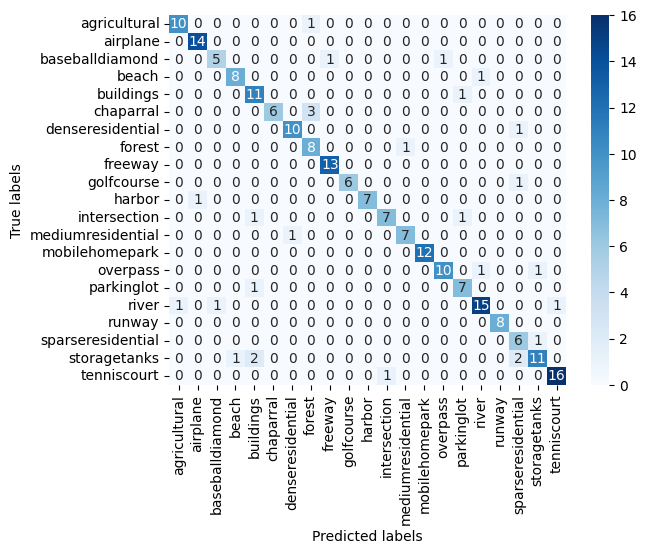

In [ ]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# assume y_true and y_pred are the true labels and predicted labels, respectively
cm = confusion_matrix(y_true, y_pred)

# define class names
landuse_class_names =['agricultural',
 'airplane',
 'baseballdiamond',
 'beach',
 'buildings',
 'chaparral',
 'denseresidential',
 'forest',
 'freeway',
 'golfcourse',
 'harbor',
 'intersection',
 'mediumresidential',
 'mobilehomepark',
 'overpass',
 'parkinglot',
 'river',
 'runway',
 'sparseresidential',
 'storagetanks',
 'tenniscourt']
# create heatmap with labeled axes
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# set labels
plt.xlabel('Predicted labels')
plt.ylabel('True labels')


In [ ]:
cm

array([[10,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0, 14,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  5,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  1,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  8,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         1,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 11,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  6,  0,  3,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 10,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  8,  0,  0,  0,  0,  1,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 13,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  6,  0,  0,  0,  0,  0,  0,
         0,  0,  1,

In [ ]:
num_classes = 21  # classes
precision = []
recall = []

for i in range(num_classes):
    tp = cm[i, i]  # True positives for class i
    fp = sum(cm[:, i]) - tp  # False positives for class i
    fn = sum(cm[i, :]) - tp  # False negatives for class i

    # Calculate precision (p) and recall (r) for class i
    p = tp / (tp + fp) if (tp + fp) > 0 else 0.0  # Handle division by zero
    r = tp / (tp + fn) if (tp + fn) > 0 else 0.0  # Handle division by zero

    # Append precision and recall to respective lists
    precision.append(p)
    recall.append(r)

print("Precision:", precision)
print("Recall:", recall)


Precision: [0.9090909090909091, 0.9333333333333333, 0.8333333333333334, 0.8888888888888888, 0.7333333333333333, 1.0, 0.9090909090909091, 0.6666666666666666, 0.9285714285714286, 1.0, 1.0, 0.875, 0.875, 1.0, 0.9090909090909091, 0.7777777777777778, 0.8823529411764706, 1.0, 0.6, 0.8461538461538461, 0.9411764705882353]
Recall: [0.9090909090909091, 1.0, 0.7142857142857143, 0.8888888888888888, 0.9166666666666666, 0.6666666666666666, 0.9090909090909091, 0.8888888888888888, 1.0, 0.8571428571428571, 0.875, 0.7777777777777778, 0.875, 1.0, 0.8333333333333334, 0.875, 0.8333333333333334, 1.0, 0.8571428571428571, 0.6875, 0.9411764705882353]


In [ ]:
# calculate precision and recall for each class
num_classes = 21
precision = []
recall = []
for i in range(num_classes):
    tp = cm[i, i]
    fp = sum(cm[:, i]) - tp
    fn = sum(cm[i, :]) - tp
    p = tp / (tp + fp)
    r = tp / (tp + fn)
    precision.append(p)
    recall.append(r)

print("Precision:", precision)
print("Recall:", recall)

Precision: [0.9090909090909091, 0.9333333333333333, 0.8333333333333334, 0.8888888888888888, 0.7333333333333333, 1.0, 0.9090909090909091, 0.6666666666666666, 0.9285714285714286, 1.0, 1.0, 0.875, 0.875, 1.0, 0.9090909090909091, 0.7777777777777778, 0.8823529411764706, 1.0, 0.6, 0.8461538461538461, 0.9411764705882353]
Recall: [0.9090909090909091, 1.0, 0.7142857142857143, 0.8888888888888888, 0.9166666666666666, 0.6666666666666666, 0.9090909090909091, 0.8888888888888888, 1.0, 0.8571428571428571, 0.875, 0.7777777777777778, 0.875, 1.0, 0.8333333333333334, 0.875, 0.8333333333333334, 1.0, 0.8571428571428571, 0.6875, 0.9411764705882353]


In [ ]:
from sklearn.metrics import f1_score

# Calculate the F1 score
f1 = f1_score(y_true, y_pred, average='weighted')

In [ ]:
from sklearn.metrics import classification_report

# get the classification report, which includes F1 score for each class
report = classification_report(y_true, y_pred)

# print the classification report
print(report)


                   precision    recall  f1-score   support

     agricultural       0.91      0.91      0.91        11
         airplane       0.93      1.00      0.97        14
  baseballdiamond       0.83      0.71      0.77         7
            beach       0.89      0.89      0.89         9
        buildings       0.73      0.92      0.81        12
        chaparral       1.00      0.67      0.80         9
 denseresidential       0.91      0.91      0.91        11
           forest       0.67      0.89      0.76         9
          freeway       0.93      1.00      0.96        13
       golfcourse       1.00      0.86      0.92         7
           harbor       1.00      0.88      0.93         8
     intersection       0.88      0.78      0.82         9
mediumresidential       0.88      0.88      0.88         8
   mobilehomepark       1.00      1.00      1.00        12
         overpass       0.91      0.83      0.87        12
       parkinglot       0.78      0.88      0.82       

**SAVING MODEL**

In [ ]:
import os
from tensorflow.keras.models import load_model

# Assuming 'model' is your Keras model object
save_path = '/content/drive/MyDrive/GoogleNet/models/GoogleNet.h5'
model.save(save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# **EXPLAINABILITY FOR LIME**

In [ ]:
! pip install lime

first image to predict
actual label:  freeway
1/1 [==============================] - 0s 24ms/step
predicted label: freeway
8


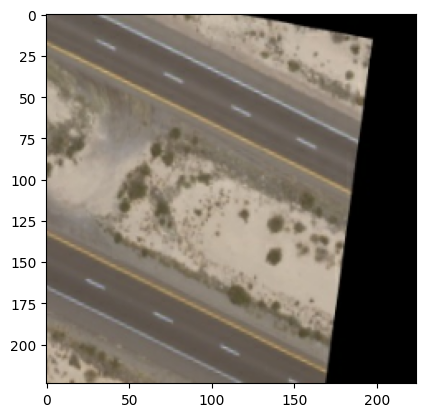

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label= labels_batch [0].numpy()

    print("first image to predict")
    plt.imshow(first_image)

    print("actual label: ",landuse_class_names[first_label])
    batch_prediction=model.predict(images_batch)
    batch_prediction = model.predict(np.expand_dims(images_batch[0], axis=0))
    print("predicted label:",landuse_class_names[np.argmax(batch_prediction[0])])
    print(np.argmax(batch_prediction[0]))
    # np.argmax(predictions_main)





In [ ]:
# import all of the necessary libraries
import lime
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
# generate the LIME explanation
explainer = lime_image.LimeImageExplainer()
# Define a predict_proba function for your model
def predict_proba(images):
    # Make predictions with your model
    preds = model.predict(images)
    # Return the predicted probabilities
    return preds

def my_explain_instance(image):
  # Generate an explanation for the test image
  explanation = explainer.explain_instance(
    image,
    predict_proba,
    top_labels=3,
    num_samples=1000,
    labels=(0, 1)
)
# Generate an explanation for the test image
explanation = explainer.explain_instance(
    first_image,
    predict_proba,
    top_labels=3,
    num_samples=1000,
    labels=(0, 1)
)

# Show the top labels for the test image
print('Top labels for test image:')
for label in explanation.top_labels:
    print(label)

# Show the explanation for the top label
print('Explanation for top label:')
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


IndexError: index 14 is out of bounds for axis 1 with size 10

In [ ]:
# Visualize the resulting explanation
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Get the image and explanation as numpy arrays
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(image)

NameError: name 'explanation' is not defined

**SHAPLEY ADDIDITIVE EXPLAINABLILITY**

In [ ]:
!pip install shap

first image to predict
actual label:  chaparral
1/1 [==============================] - 0s 41ms/step


IndexError: list index out of range

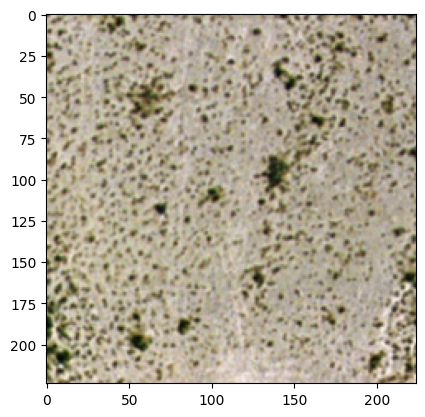

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt


for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label= labels_batch [0].numpy()

    print("first image to predict")
    plt.imshow(first_image)

    print("actual label: ",landuse_class_names[first_label])
    batch_prediction=model.predict(images_batch)
    print("predicted label:",landuse_class_names[np.argmax(batch_prediction[0])])





In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

def get_image_for_prediction(dataset, class_names, image_size=(224, 224)):
    # Get the first image and label from the dataset
    for images_batch, labels_batch in dataset.take(1):
        first_image = images_batch[0].numpy().astype('uint8')
        first_label = labels_batch[0].numpy()

        # Display the image and print the actual label
        plt.imshow(first_image)
        plt.show()
        print("Actual label:", class_names[first_label])

        # Preprocess the image for model input
        image = tf.image.convert_image_dtype(first_image, tf.float32)
        image = tf.image.resize_with_pad(image, target_height=image_size[0], target_width=image_size[1])
        image = tf.expand_dims(image, axis=0)  # Add batch dimension

        return image



Image to predict: 1


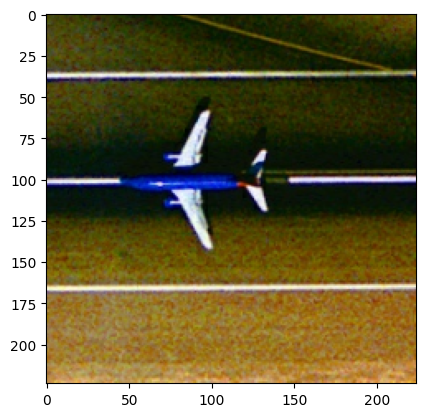

Actual label: airplane
1/1 [==============================] - 0s 24ms/step
Predicted label: airplane
Image to predict: 2


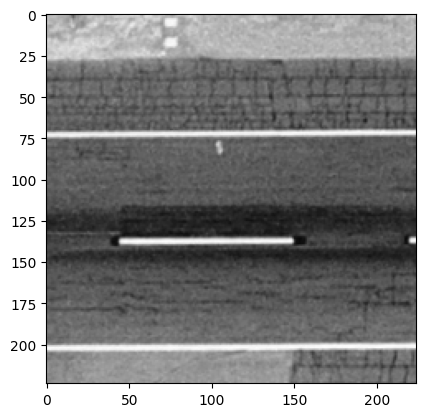

Actual label: runway
1/1 [==============================] - 0s 23ms/step
Predicted label: runway
Image to predict: 3


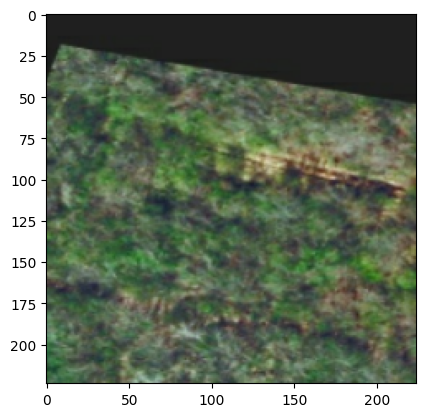

Actual label: forest
1/1 [==============================] - 0s 24ms/step
Predicted label: forest
Image to predict: 4


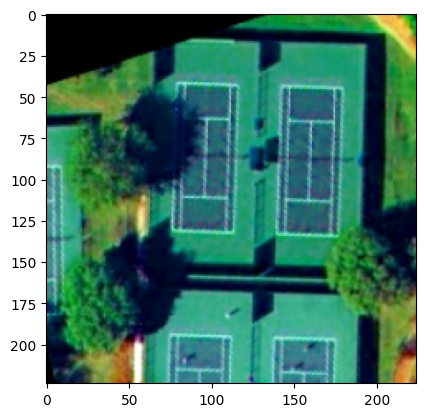

Actual label: tenniscourt
1/1 [==============================] - 0s 23ms/step
Predicted label: tenniscourt
Image to predict: 5


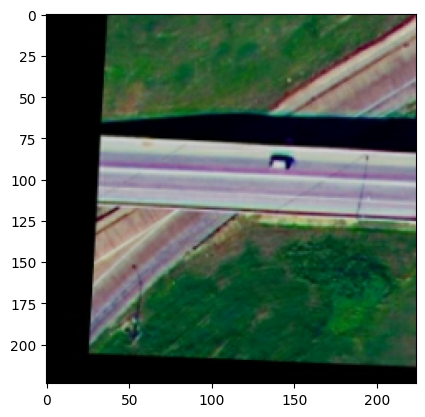

Actual label: overpass
1/1 [==============================] - 0s 23ms/step
Predicted label: overpass
Image to predict: 6


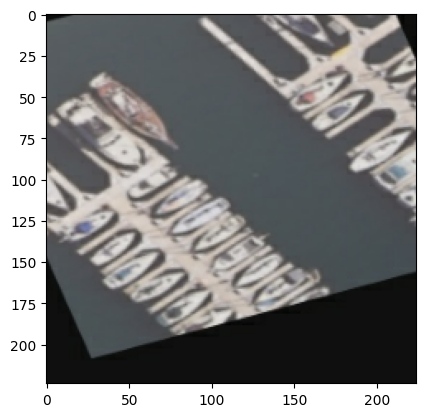

Actual label: harbor
1/1 [==============================] - 0s 23ms/step
Error: Predicted label index out of range
Image to predict: 7


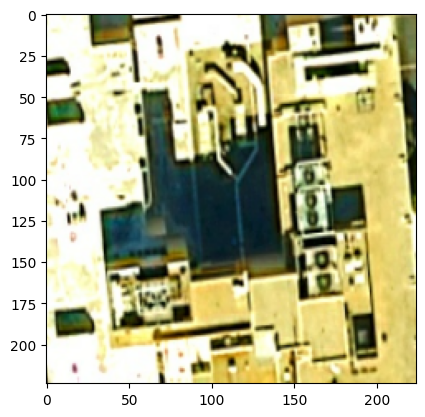

Actual label: buildings
1/1 [==============================] - 0s 24ms/step
Predicted label: buildings
Image to predict: 8


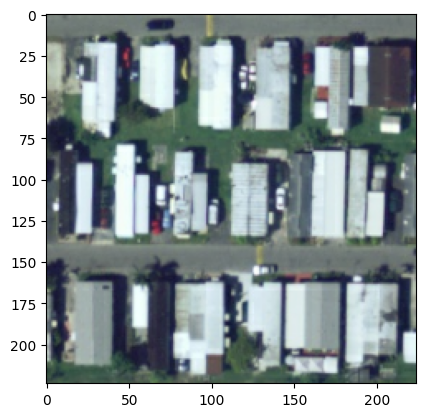

Actual label: mobilehomepark
1/1 [==============================] - 0s 24ms/step
Predicted label: mobilehomepark
Image to predict: 9


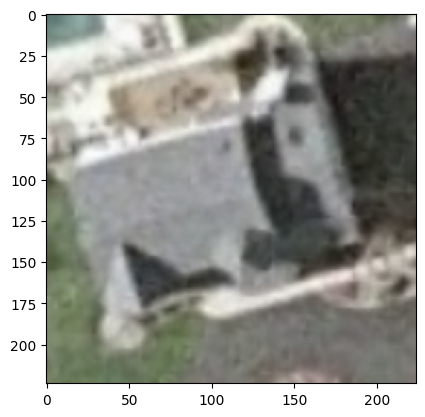

Actual label: sparseresidential
1/1 [==============================] - 0s 23ms/step
Predicted label: storagetanks
Image to predict: 10


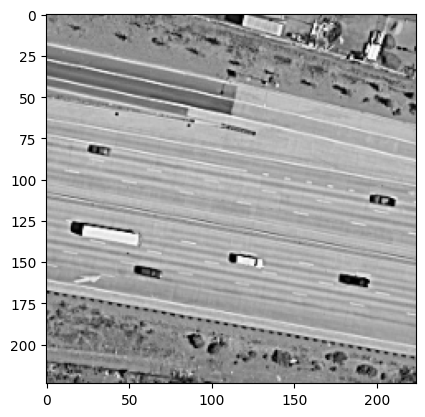

Actual label: freeway
1/1 [==============================] - 0s 22ms/step
Error: Predicted label index out of range
Image to predict: 11


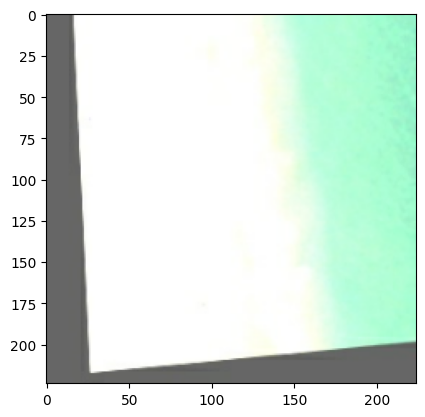

Actual label: beach
1/1 [==============================] - 0s 24ms/step
Error: Predicted label index out of range
Image to predict: 12


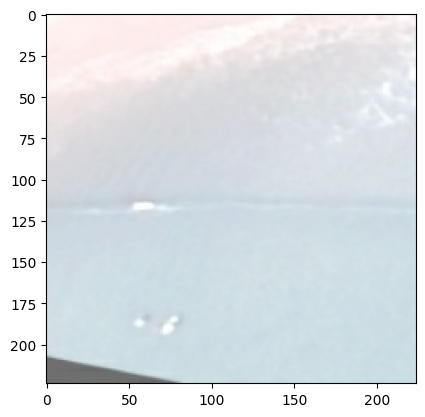

Actual label: beach
1/1 [==============================] - 0s 24ms/step
Error: Predicted label index out of range
Image to predict: 13


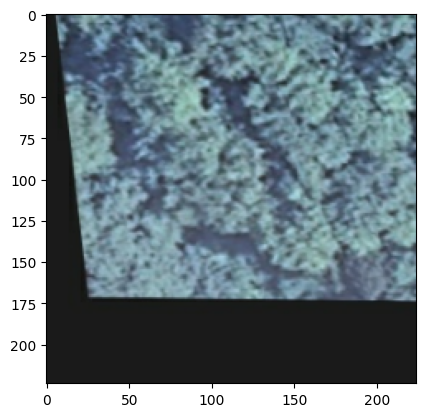

Actual label: forest
1/1 [==============================] - 0s 22ms/step
Predicted label: forest
Image to predict: 14


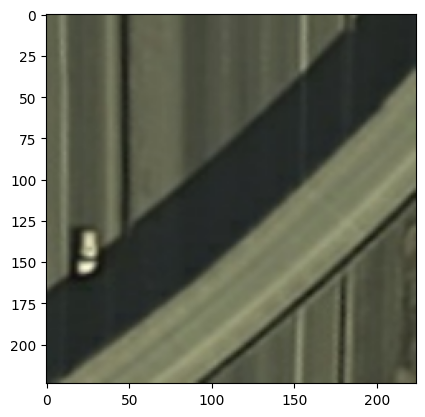

Actual label: overpass
1/1 [==============================] - 0s 23ms/step
Error: Predicted label index out of range
Image to predict: 15


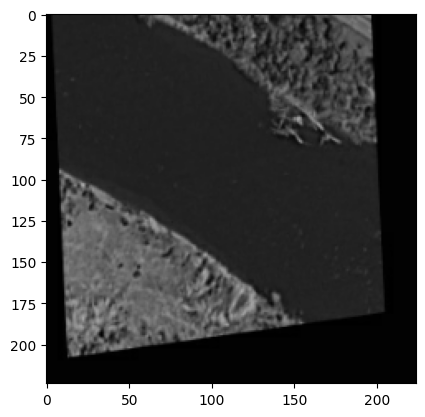

Actual label: river
1/1 [==============================] - 0s 29ms/step
Predicted label: river
Image to predict: 16


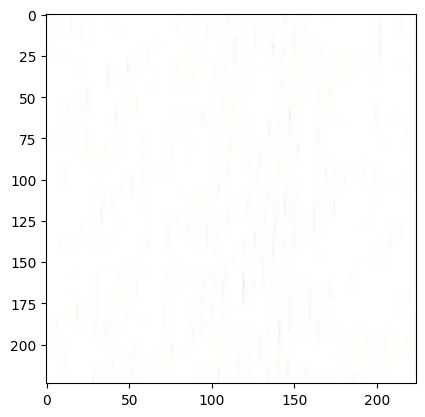

Actual label: agricultural
1/1 [==============================] - 0s 24ms/step
Error: Predicted label index out of range
Image to predict: 17


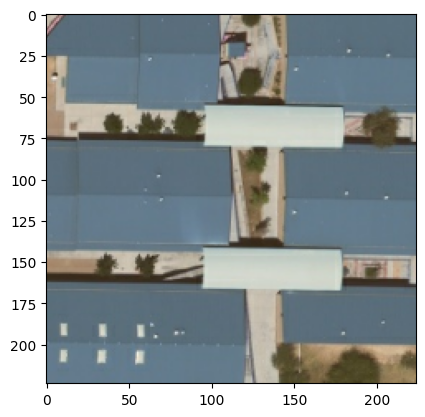

Actual label: buildings
1/1 [==============================] - 0s 24ms/step
Predicted label: buildings
Image to predict: 18


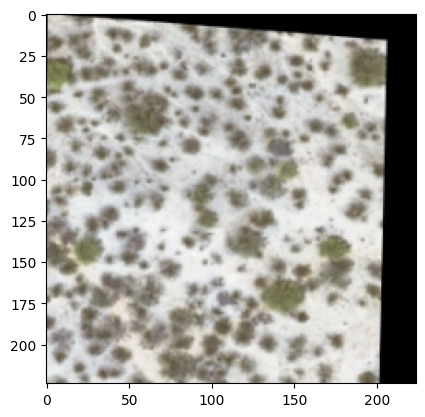

Actual label: chaparral
1/1 [==============================] - 0s 23ms/step
Error: Predicted label index out of range
Image to predict: 19


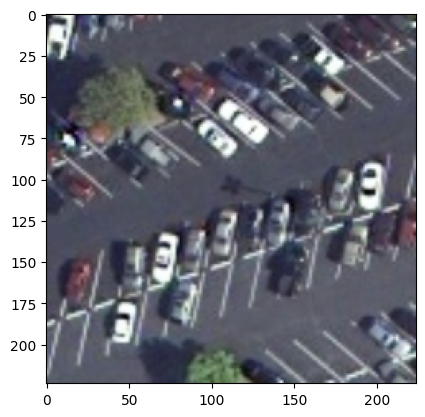

Actual label: parkinglot
1/1 [==============================] - 0s 25ms/step
Predicted label: intersection
Image to predict: 20


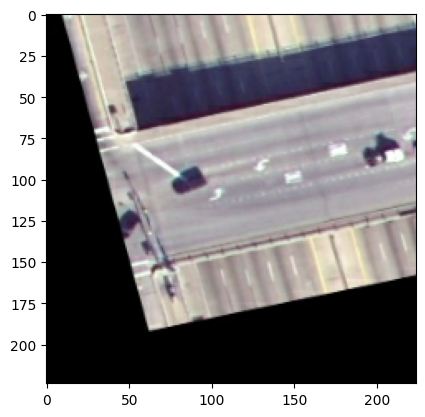

Actual label: overpass
1/1 [==============================] - 0s 24ms/step
Predicted label: overpass
Image to predict: 21


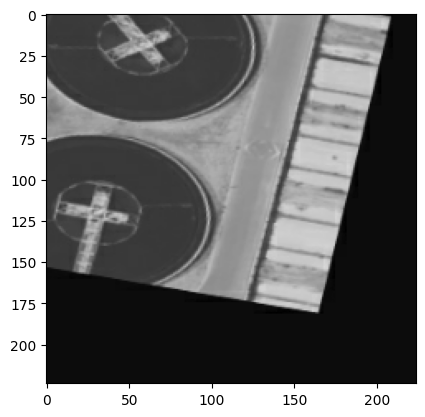

Actual label: storagetanks
1/1 [==============================] - 0s 25ms/step
Predicted label: storagetanks
Image to predict: 22


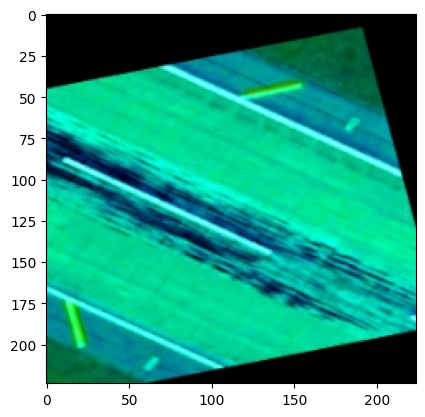

Actual label: runway
1/1 [==============================] - 0s 26ms/step
Predicted label: runway
Image to predict: 23


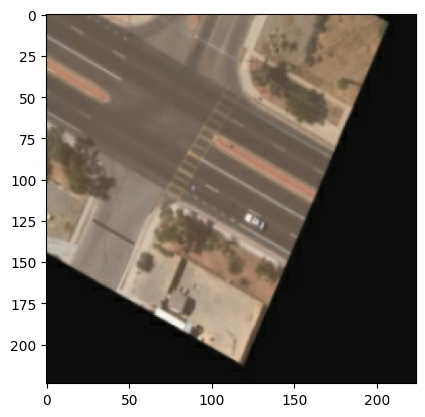

Actual label: intersection
1/1 [==============================] - 0s 26ms/step
Error: Predicted label index out of range
Image to predict: 24


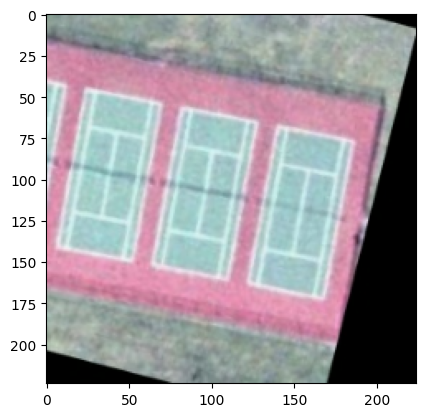

Actual label: tenniscourt
1/1 [==============================] - 0s 23ms/step
Error: Predicted label index out of range
Image to predict: 25


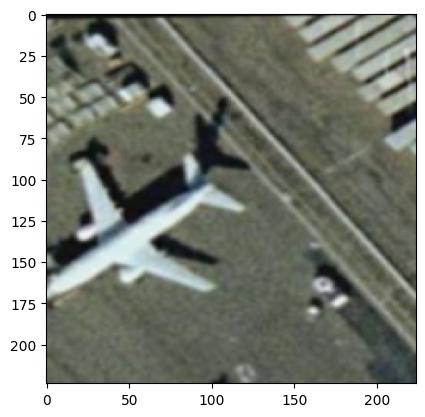

Actual label: airplane
1/1 [==============================] - 0s 24ms/step
Error: Predicted label index out of range
Image to predict: 26


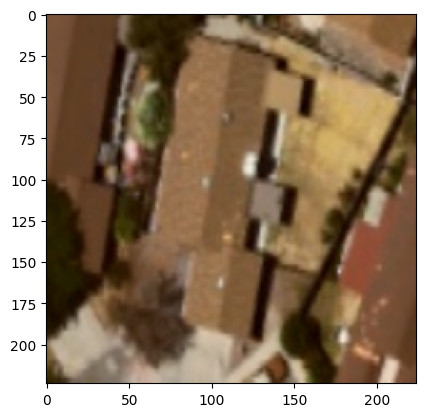

Actual label: denseresidential
1/1 [==============================] - 0s 23ms/step
Predicted label: mobilehomepark
Image to predict: 27


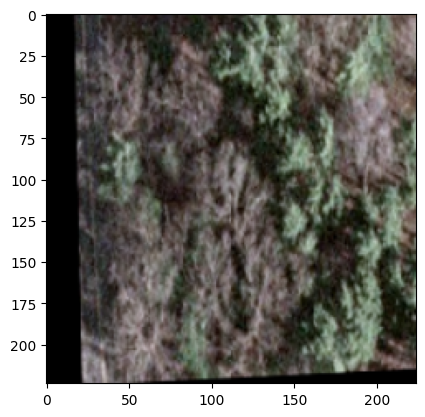

Actual label: forest
1/1 [==============================] - 0s 23ms/step
Predicted label: forest
Image to predict: 28


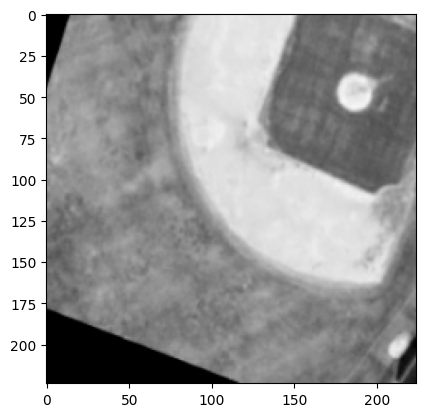

Actual label: baseballdiamond
1/1 [==============================] - 0s 23ms/step
Predicted label: baseballdiamond
Image to predict: 29


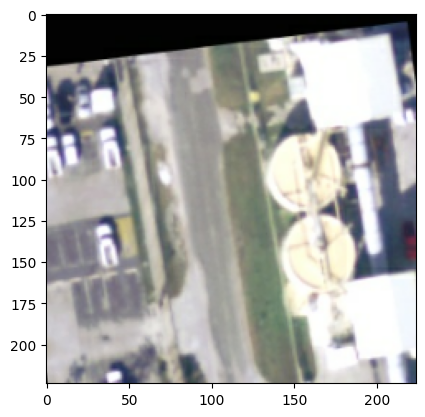

Actual label: storagetanks
1/1 [==============================] - 0s 22ms/step
Predicted label: storagetanks
Image to predict: 30


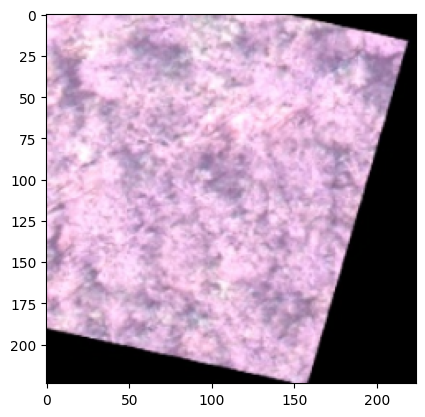

Actual label: forest
1/1 [==============================] - 0s 24ms/step
Error: Predicted label index out of range
Image to predict: 31


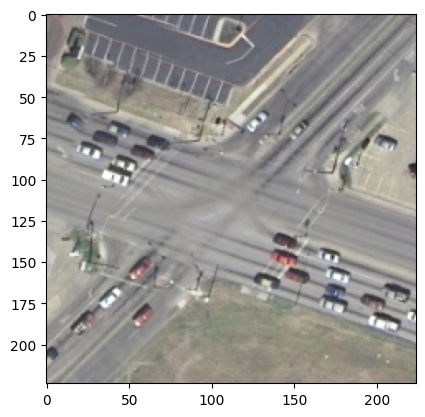

Actual label: intersection
1/1 [==============================] - 0s 24ms/step
Predicted label: intersection
Image to predict: 32


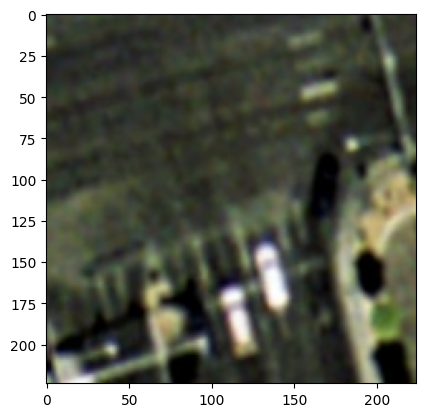

Actual label: intersection
1/1 [==============================] - 0s 25ms/step
Predicted label: intersection


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

landuse_class_names = dataset.class_names

images_array = []  # Array to store the images

for images_batch, labels_batch in test_data_s.take(1):
    for i in range(len(images_batch)):  # Loop over all images in the batch
        image = images_batch[i].numpy().astype('uint8')
        label = labels_batch[i].numpy()

        print("Image to predict:", i + 1)
        plt.imshow(image)
        plt.show()

        print("Actual label:", landuse_class_names[label])

        # Ensure batch_prediction is valid before accessing it
        batch_prediction = model.predict(np.expand_dims(images_batch[i], axis=0))
        if len(batch_prediction) > 0:
            predicted_label_index = np.argmax(batch_prediction)
            if 0 <= predicted_label_index < len(landuse_class_names):
                predicted_label = landuse_class_names[predicted_label_index]
                print("Predicted label:", predicted_label)
            else:
                print("Error: Predicted label index out of range")
        else:
            print("Error: No predictions returned")

        images_array.append(image)


In [ ]:
import shap
shap.initjs()
print(first_image.shape)

# Create a SHAP masker
masker = shap.maskers.Image("inpaint_telea", first_image.shape)

# Create an explainer object with the defined model and masker
explainer = shap.Explainer(model, masker, output_names=landuse_class_names)

explainer

SHAP Version : 0.45.0


(224, 224, 3)


In [ ]:
# Convert the list of images to a numpy array
images_array = np.array(images_array)
shap_values = explainer(images_array, outputs=shap.Explanation.argsort.flip[:5])

shap_values.shape
shap.image_plot(shap_values)

AssertionError: The model produced 2 output rows when given 1 input rows! Check the implementation of the model you provided for errors.